## Imports


In [368]:
# necessary imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from tqdm import tqdm, trange
import os
import requests
import rasterio
from rasterio.windows import Window
from itertools import product
import unittest

## Implemenation


In [190]:
class ForestFireModel:
    UNBURNED = 0
    BURNING = 1
    BURNED = 2

    def __init__(
        self,
        density_array,
        wind_vector=(0, 0),
        k=1.0,
        burn_rate=0.5,
        burn_threshold=0.01,
    ):
        # grid dimension
        self.size = len(density_array)

        # fuel density grid
        self.density = np.array(density_array, dtype=np.float32)

        # fire state grid: UNBURNED, BURNING or BURNED
        self.state = np.full((self.size, self.size), self.UNBURNED, dtype=np.int8)

        # ignition probability grid
        self.p_catch = np.zeros((self.size, self.size), dtype=np.float32)

        # wind vector and wind‐influence coefficient
        self.wind = np.array(wind_vector, dtype=np.float32)
        self.k = k

        # fraction of density consumed per step
        self.burn_rate = burn_rate

        # density cutoff for marking a cell burned
        self.burn_threshold = burn_threshold

        # eight neighbor offsets for Moore neighborhood
        self._neighbor_offsets = [
            (dx, dy)
            for dx, dy in product([-1, 0, 1], repeat=2)
            if not (dx == 0 and dy == 0)
        ]

    def initialize(self, callback=None):
        """Try until a valid cell with density is found to ignite."""
        if callback is None:
            y, x = np.random.randint(0, self.size, size=2)
            while self.density[y, x] < self.burn_threshold:
                y, x = np.random.randint(0, self.size, size=2)
            # ignite a random cell
            self.state[y, x] = self.BURNING
        else:
            callback(self.state, self.density)

    def step(self):
        # pad state once to enforce closed boundaries
        state_pad = np.pad(self.state, pad_width=1, mode="constant", constant_values=0)

        # pad density once to enforce closed boundaries
        density_pad = np.pad(
            self.density, pad_width=1, mode="constant", constant_values=0
        )

        # compute ignition probabilities using padded arrays
        self._compute_p_catch(state_pad, density_pad)

        # consume fuel and extinguish currently burning cells
        self._burn_cells()

        # ignite new cells based on computed probabilities
        self._ignite_cells()

    def _compute_p_catch(self, state_pad, density_pad):
        # start with probability of not catching fire = 1 everywhere
        p_no_catch = np.ones((self.size, self.size), dtype=np.float32)

        for dx, dy in self._neighbor_offsets:
            # extract neighbor state window without wrapping
            nbr_state = state_pad[
                1 + dy : 1 + dy + self.size, 1 + dx : 1 + dx + self.size
            ]

            # extract neighbor density window without wrapping
            nbr_density = density_pad[
                1 + dy : 1 + dy + self.size, 1 + dx : 1 + dx + self.size
            ]

            # compute spread probability from this neighbor
            direction = np.array([-dx, -dy], dtype=np.float32)
            direction /= np.linalg.norm(direction)
            alignment = np.dot(direction, self.wind)
            P_s = self.k * nbr_density * self.density * (1 + alignment)
            P_s = np.clip(P_s, 0.0, 1.0)

            # mask of burning neighbors
            burning_mask = nbr_state == self.BURNING

            # multiplier for no-catch probability
            multiplier = np.where(burning_mask, 1 - P_s, 1.0)

            # accumulate no-catch probability
            p_no_catch *= multiplier

        # final ignition probability is the complement
        self.p_catch = 1 - p_no_catch

    def _ignite_cells(self):
        # draw random numbers for each cell
        rnd = np.random.random((self.size, self.size))

        # identify unburned cells where rnd < p_catch
        mask = (self.state == self.UNBURNED) & (rnd < self.p_catch)

        # ignite those cells
        self.state[mask] = self.BURNING

    def _burn_cells(self):
        # mask of cells that are currently burning
        burning_mask = self.state == self.BURNING

        # reduce density only for burning cells
        self.density[burning_mask] *= 1 - self.burn_rate

        # identify cells fully consumed
        done_mask = burning_mask & (self.density < self.burn_threshold)

        # mark them as burned
        self.state[done_mask] = self.BURNED

In [191]:
class ForestFireAnimator:
    def __init__(self, model=None):
        # reference to the density‐based ForestFireModel
        self.model = model

        # image handle placeholder
        self.im = None

        # step counter for titles and progress
        self.step_counter = 0

        # progress‐bar instance
        self.progress_bar = None

    def _grid_to_rgb(self):
        # allocate RGB array
        rgb = np.zeros((self.model.size, self.model.size, 3), dtype=np.float32)

        # unburned cells: interpolate white→green by density
        mask = self.model.state == self.model.UNBURNED
        d = self.model.density[mask]
        rgb[mask] = np.stack(
            [
                (1 - d) * 1.0 + d * 0.0,  # red channel
                (1 - d) * 1.0 + d * 0.6,  # green channel
                (1 - d) * 1.0 + d * 0.0,  # blue channel
            ],
            axis=1,
        )

        # burning cells: interpolate white→red by density
        mask = self.model.state == self.model.BURNING
        d = self.model.density[mask]
        rgb[mask] = np.stack(
            [
                # red channel at full intensity
                np.ones_like(self.model.density[mask]),
                # green channel ramps up to 1 at half density
                np.minimum(self.model.density[mask] * 2, 1.0),
                # blue channel appears beyond half density, reaching 1 at full density
                np.clip((self.model.density[mask] - 0.5) * 2, 0.0, 1.0),
            ],
            axis=1,
        )

        # burned cells: solid dark gray
        mask = self.model.state == self.model.BURNED
        rgb[mask] = np.array([0.6, 0.6, 0.6], dtype=np.float32)

        return rgb

    def _init_plot(self):
        # draw the first frame
        self.im = self.ax.imshow(self._grid_to_rgb(), interpolation="nearest")
        self.ax.axis("off")
        return [self.im]

    def _update(self, _):
        # advance the model by the given number of steps
        for _ in range(self.steps_per_frame):
            self.model.step()
            self.step_counter += 1

        # update the displayed image
        self.im.set_data(self._grid_to_rgb())
        self.ax.set_title(f"Step {self.step_counter}")

        # advance the progress bar
        if self.progress_bar:
            self.progress_bar.update(self.steps_per_frame)

        return [self.im]

    def set_model(self, new_model):
        # swap in the new model
        self.model = new_model

        # reset counters and handles
        self.step_counter = 0
        self.progress_bar = None
        self.im = None

        # close any existing figure
        if getattr(self, "fig", None) is not None:
            plt.close(self.fig)

        # create a fresh figure and axis
        self.fig = plt.figure(figsize=(6, 6))
        self.ax = self.fig.add_subplot(111)
        self.ax.axis("off")
        plt.close(self.fig)

    def animate(
        self,
        total_frames=100,
        steps_per_frame=1,
        fps=30,
        start_after_steps=0,
        progress_bar=True,
        callback=None,
    ):
        # create figure and axis
        self.fig = plt.figure(figsize=(6, 6))
        self.ax = self.fig.add_subplot(111)

        # set how many model steps per animation frame
        self.steps_per_frame = steps_per_frame

        # set the callback function for initialization
        self.model.initialize(callback)

        # advance the model before the animation starts
        for _ in range(start_after_steps):
            self.model.step()
            self.step_counter += 1

        # configure the progress bar
        self.progress_bar = tqdm(
            total=total_frames * steps_per_frame,
            initial=self.step_counter,
            disable=not progress_bar,
            desc="Simulation",
        )

        # build the animation
        anim = FuncAnimation(
            self.fig,
            self._update,
            init_func=self._init_plot,
            frames=total_frames,
            interval=1000 / fps,
            blit=False,
        )

        # render to HTML5 video for inline display
        video = HTML(anim.to_html5_video())

        # clean up
        self.progress_bar.close()
        plt.close(self.fig)

        return video

## Tests

In [ ]:
class TestForestFireModel(unittest.TestCase):
    """tests for the ForestFireModel class."""

    def setUp(self):
        """Define default parameters and fix random seed for reproducibility."""
        # grid dimension for square lattice
        self.size = 10
        # uniform fuel density grid
        self.density = np.ones((self.size, self.size), dtype=np.float32)
        # no prevailing wind by default
        self.wind = (0, 0)
        # base spread coefficient
        self.k = 1.0
        # fraction of fuel consumed per time step
        self.burn_rate = 0.5
        # density threshold below which cell is considered burned
        self.burn_threshold = 0.01
        # ensure deterministic random draws
        np.random.seed(42)

    def create_model(self, **kwargs):
        """
        Instantiate a ForestFireModel with default settings,
        allowing any parameter to be overridden.
        """
        params = {
            "density_array": self.density,
            "wind_vector": self.wind,
            "k": self.k,
            "burn_rate": self.burn_rate,
            "burn_threshold": self.burn_threshold,
        }
        # integrate any custom overrides
        params.update(kwargs)
        return ForestFireModel(**params)

    def test_initialize_ignites_one_cell(self):
        """Verify that exactly one cell ignites when initialize is invoked."""
        model = self.create_model()
        model.initialize()
        # count cells in BURNING state
        burning_count = np.sum(model.state == model.BURNING)
        self.assertEqual(
            burning_count, 1, "Initialization must ignite exactly one cell."
        )


    def test_step_reduces_density_in_burning_cells(self):
        """Confirm that a single step diminishes fuel in the originally burning cell."""
        model = self.create_model()
        model.initialize()
        # mark which cells are burning before stepping
        before_mask = model.state == model.BURNING
        # snapshot fuel densities
        before_density = model.density.copy()

        model.step()

        after_density = model.density
        # assert that fuel decreased only in the pre-step burning cells
        self.assertTrue(
            np.all(after_density[before_mask] < before_density[before_mask]),
            "The originally ignited cell must consume fuel on stepping.",
        )

    def test_burned_cells_marked_and_low_density(self):
        """
        Ensure that after sufficient progression, cells transition to BURNED
        and their density drops beneath the threshold.
        """
        model = self.create_model()
        model.initialize()
        # determine required iterations to fully consume fuel
        steps_needed = (
            int(np.log(model.burn_threshold) / np.log(1 - model.burn_rate)) + 1
        )
        # advance simulation for computed steps
        for _ in range(steps_needed):
            model.step()
        burned = model.state == model.BURNED
        # check that all burned cells have low residual density
        self.assertTrue(
            np.all(model.density[burned] < model.burn_threshold),
            "Cells flagged BURNED must have density under threshold.",
        )

    def test_fire_spreads_over_time(self):
        """Check that the count of burning cells increases as fire propagates."""
        model = self.create_model()
        model.initialize()
        # initial burning cell count
        initial_burning = np.sum(model.state == model.BURNING)
        # advance several steps
        for _ in range(5):
            model.step()
        later_burning = np.sum(model.state == model.BURNING)
        # propagation implies more burning cells later
        self.assertGreater(
            later_burning,
            initial_burning,
            "Number of burning cells must increase as fire spreads.",
        )

    def test_no_spread_if_no_fuel(self):
        """Confirm that fire cannot propagate when fuel density is zero."""
        # create grid devoid of fuel
        zero_fuel = np.zeros((self.size, self.size), dtype=np.float32)
        model = self.create_model(density_array=zero_fuel)

        # manually ignite central cell
        def ignite_center(state, density):
            state[5, 5] = model.BURNING

        model.initialize(callback=ignite_center)
        model.step()
        # count burning cells after step
        burning = np.sum(model.state == model.BURNING)
        self.assertEqual(burning, 0, "Fire must not spread in absence of fuel.")

    def test_wind_accelerates_spread_downwind(self):
        """Validate that wind bias enhances ignition downwind of a burning cell."""
        # set wind blowing to the right
        strong_wind = (1.0, 0.0)
        model = self.create_model(wind_vector=strong_wind)

        # ignite a single central cell
        def ignite_center(state, density):
            state[5, 5] = model.BURNING

        model.initialize(callback=ignite_center)
        # advance multiple steps to observe wind effect
        for _ in range(5):
            model.step()
        # inspect cells to the right of ignition point
        downwind_ignited = (
            model.state[5, 6] == model.BURNING or model.state[5, 7] == model.BURNING
        )
        self.assertTrue(
            downwind_ignited,
            "Cells downwind must ignite more readily under wind influence.",
        )

    def test_no_spontaneous_ignition(self):
        """Ensure that no cell ignites absent burning neighbors."""
        model = self.create_model()
        model.initialize()
        # reset all cells to unburned and zero ignition probability
        model.state.fill(model.UNBURNED)
        model.p_catch.fill(0.0)
        model.step()
        # confirm no new burning cells appear
        burning = np.sum(model.state == model.BURNING)
        self.assertEqual(
            burning,
            0,
            "Cells should not ignite spontaneously without burning neighbors.",
        )

In [282]:
unittest.main(argv=["first-arg-is-ignored"], exit=False)

.......
----------------------------------------------------------------------
Ran 7 tests in 0.014s

OK


## Analysis


In [123]:
def download_hansen_tile(lat_label="00N", lon_label="010E", dest_folder="data"):
    base_url = "https://storage.googleapis.com/earthenginepartners-hansen/GFC-2019-v1.7"
    filename = f"Hansen_GFC-2019-v1.7_treecover2000_{lat_label}_{lon_label}.tif"
    url = f"{base_url}/{filename}"
    os.makedirs(dest_folder, exist_ok=True)
    filepath = os.path.join(dest_folder, filename)

    if not os.path.exists(filepath):
        print(f"Downloading {filename} ...")
        response = requests.get(url, stream=True)
        with open(filepath, "wb") as f:
            for chunk in response.iter_content(chunk_size=8192):
                f.write(chunk)
        print("Download complete.")
    else:
        print("File already exists.")

    return filepath

In [124]:
def load_tree_cover_data(file_path, size=100, offset_deg=(0, 0)):
    """
    Load tree cover data from a file, allowing specification of a region
    starting at given coordinates.

    Parameters:
    file_path (str): Path to the .tif file.
    size (int): The size of the square subset to extract.
    start_coords (tuple): top-left corner of the window.

    Returns:
    np.array: The extracted subset of the data.
    """
    PIXELS_PER_DEGREE = 4000
    start_coords = (
        int(offset_deg[0] * PIXELS_PER_DEGREE),
        int(offset_deg[1] * PIXELS_PER_DEGREE),
    )
    try:
        with rasterio.open(file_path) as src:
            # Validate if the requested window is within the data bounds
            if (
                start_coords[0] + size > src.height
                or start_coords[1] + size > src.width
            ):
                print("Requested size and start coordinates exceed data boundaries.")
                return None

            # Define the window to read
            window = Window(
                col_off=start_coords[1],
                row_off=start_coords[0],
                width=size,
                height=size,
            )
            data = src.read(1, window=window)
            # Normalize the data to [0, 1] range
            data = np.clip(data.astype(np.float32) / 100.0, 0, 1)
            return data
    except rasterio.errors.RasterioIOError as e:
        print(f"Error accessing the file: {e}")
        return None
    except Exception as e:
        print(f"Unexpected error: {e}")
        return None

In [125]:
animator = ForestFireAnimator()

### Sanity Check (Amazon rainforest)


In [138]:
tif_path = download_hansen_tile(lat_label="00N", lon_label="070W")
tree_cover = load_tree_cover_data(tif_path, size=200)

File already exists.


In [ ]:
# high density of tree cover with no wind.
model = ForestFireModel(
    density_array=tree_cover,
    k=0.3,
    burn_rate=0.1,
    burn_threshold=0.1,
)

animator.set_model(model)

animator.animate(total_frames=200, fps=15)

Simulation:   0%|          | 0/200 [00:00<?, ?it/s]

Simulation: 100%|██████████| 200/200 [00:02<00:00, 71.87it/s]


In [140]:
# added wind bias of 0.5 east direction
model = ForestFireModel(
    density_array=tree_cover,
    k=0.3,
    burn_rate=0.1,
    burn_threshold=0.1,
    wind_vector=(1, 0),
)

animator.set_model(model)

animator.animate(
    total_frames=200,
    fps=10,
)

Simulation: 100%|██████████| 200/200 [00:02<00:00, 79.42it/s]


In [141]:
# added wind bias of 2 south direction
model = ForestFireModel(
    density_array=tree_cover,
    k=0.3,
    burn_rate=0.1,
    burn_threshold=0.1,
    wind_vector=(0, 2),
)

animator.set_model(model)

animator.animate(
    total_frames=200,
    fps=10,
)

Simulation: 100%|██████████| 200/200 [00:02<00:00, 78.48it/s]


### Palisades Fire


In [225]:
# Palisades Fire (34.170°N 118.618°W.)
tif_path = download_hansen_tile(lat_label="40N", lon_label="120W")
# 40 - 34.170 = 5.83
# 120 - 118.618 = 1.38
# 5.83°E, 1.38°N
tree_cover = load_tree_cover_data(
    tif_path, offset_deg=(5.8291124681, 1.3817035957), size=500
)

File already exists.


In [226]:
model = ForestFireModel(
    density_array=tree_cover,
    k=0.5,
    burn_rate=0.1,
    burn_threshold=0.05,
)

animator.set_model(model)

animator.animate(
    total_frames=100,
    fps=10,
)

Simulation: 100%|██████████| 100/100 [00:03<00:00, 33.31it/s]


#### Fire spread


In [181]:
def get_fire_growth_curves(tree_cover, k, burn_rate, burn_threshold):
    """
    Run one fire simulation and return fire growth curves.

    Parameters:
    - tree_cover: 2D numpy array of initial tree densities
    - k: spread coefficient
    - burn_rate: proportion of tree density consumed per step
    - burn_threshold: density threshold to mark a cell as burned

    Returns:
    - burning_curve: list of number of burning cells at each time step
    - burned_curve: list of cumulative burned cells at each time step
    """
    model = ForestFireModel(
        density_array=tree_cover.copy(),
        k=k,
        burn_rate=burn_rate,
        burn_threshold=burn_threshold,
    )

    def ig_fn(state, density):
        # ignite a random cell with density > 0.3
        y, x = np.random.randint(0, model.size, size=2)
        while density[y, x] < 0.3:
            y, x = np.random.randint(0, model.size, size=2)
        state[y, x] = model.BURNING

    model.initialize(callback=ig_fn)  # assumes random ignition

    burning_curve = []
    burned_curve = []

    while np.any(model.state == model.BURNING):
        burning_count = np.sum(model.state == model.BURNING)
        burned_count = np.sum(model.state == model.BURNED)

        burning_curve.append(burning_count)
        burned_curve.append(burned_count)

        model.step()

    return burning_curve, burned_curve

In [242]:
def plot_fire_growth_curves(burning_curve, burned_curve):
    """
    Plot fire growth over time with dual y-axes:
    - Left axis: cumulative burned cells (tab:blue)
    - Right axis: active burning cells (tab:orange)
    """
    steps = range(len(burning_curve))

    fig, ax_left = plt.subplots(figsize=(8, 5))
    ax_right = ax_left.twinx()

    # Left axis: burned (cumulative)
    ax_left.plot(steps, burned_curve, label="Burned (cumulative)", color="tab:blue")
    ax_left.set_ylabel("Burned Cells (cumulative)")
    ax_left.tick_params(axis="y", labelcolor="tab:blue")

    # Right axis: burning (active)
    ax_right.plot(steps, burning_curve, label="Burning (active)", color="tab:orange")
    ax_right.set_ylabel("Burning Cells (active)")
    ax_right.tick_params(axis="y", labelcolor="tab:orange")

    ax_left.set_xlabel("Time Step")
    fig.suptitle("Fire Spread Dynamics")
    ax_left.legend()
    ax_right.legend()
    ax_left.grid(True, linestyle="--", alpha=0.5)
    fig.tight_layout()
    plt.show()

In [303]:
def plot_burned_area_vs_burn_rate(
    tree_cover, k, burn_threshold, num_runs=10, num_points=10
):
    """
    Vary the burn rate parameter and plot the final burned area with error bars.

    Parameters:
        tree_cover: 2D numpy array of tree densities
        k: spread coefficient
        burn_threshold: density threshold for marking cells as burned
        num_runs: number of independent simulations per burn rate
        num_points: number of different burn rates to sample between 0 and 1
    """
    burn_rates = np.linspace(
        0.05, 1, num_points
    )  # Focused range (0,1 would be too unstable)
    mean_burned = []
    std_burned = []

    for b in burn_rates:
        final_burned = []
        for _ in range(num_runs):
            _, burned_curve = get_fire_growth_curves(
                tree_cover=tree_cover,
                k=k,
                burn_rate=b,
                burn_threshold=burn_threshold,
            )
            # final burned area is the last value in the burned curve
            final_burned.append(burned_curve[-1])
        mean_burned.append(np.mean(final_burned))
        std_burned.append(np.std(final_burned))

    plt.figure(figsize=(10, 5))

    plt.errorbar(
        burn_rates,
        mean_burned,
        yerr=std_burned,
        fmt="o-",
        color="tab:red",
        capsize=4,
        capthick=1.2,
        elinewidth=1,
        label="Final Burned Area",
    )

    plt.xlabel("Burn Rate (b)")
    plt.ylabel("Final Burned Cells")
    plt.title("Final Burned Area vs. Burn Rate")
    plt.legend()
    plt.grid(alpha=0.5, linestyle="--")
    plt.show()

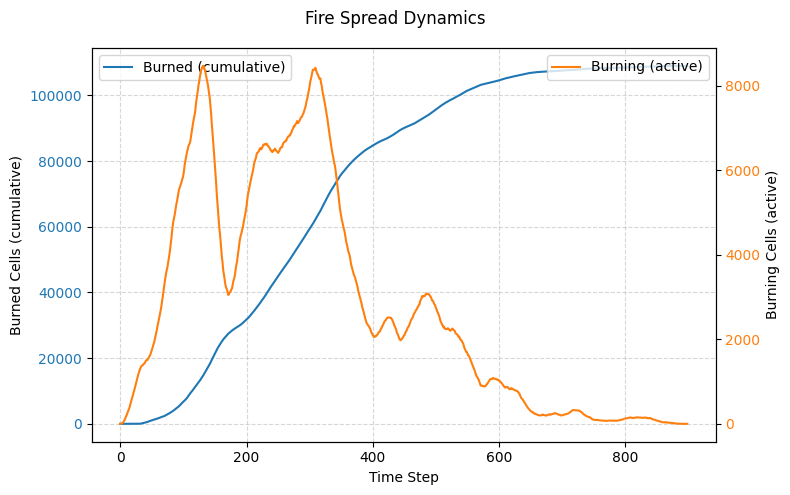

In [294]:
# for burning_rate = 0.1
burning_curve, burned_curve = get_fire_growth_curves(
    tree_cover=tree_cover, k=0.5, burn_rate=0.1, burn_threshold=0.05
)
plot_fire_growth_curves(burning_curve, burned_curve)

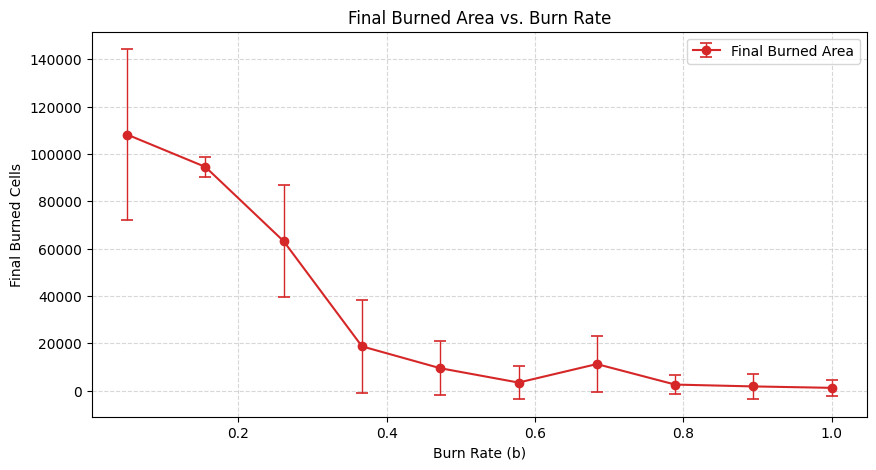

In [ ]:
# how burned area changes with burn rate
# ≈ 3 min
plot_burned_area_vs_burn_rate(
    tree_cover=tree_cover, k=0.5, burn_threshold=0.05, num_runs=10, num_points=10
)

#### Reachabiliy


In [150]:
def compute_reachability_and_burn_proportion(
    tree_cover, k, burn_rate, burn_threshold, num_runs=100
):
    """
    Run multiple forest fire simulations with random ignition and compute:
    - reachability map: number of times each cell burned
    - burned area proportions: fraction of grid burned per run

    Parameters:
    - tree_cover: 2D NumPy array of tree densities in [0, 1]
    - k: spread coefficient
    - burn_rate: proportion of density lost per step
    - burn_threshold: density below which a cell is considered burned
    - num_runs: number of simulation runs

    Returns:
    - reachability_map: 2D array (same shape as tree_cover)
    - burned_area_proportions: list of float values in [0, 1]
    """
    reachability_map = np.zeros_like(tree_cover, dtype=np.int32)
    burned_area_proportions = []

    for _ in trange(num_runs, desc="Simulating fires"):
        model = ForestFireModel(
            density_array=tree_cover.copy(),
            k=k,
            burn_rate=burn_rate,
            burn_threshold=burn_threshold,
        )

        model.initialize()

        while np.any(model.state == model.BURNING):
            model.step()

        burned_mask = model.state == model.BURNED
        reachability_map += burned_mask.astype(np.int32)
        burned_area_proportions.append(np.mean(burned_mask))

    return reachability_map, burned_area_proportions

In [255]:
def plot_reachability_map(reachability_map, num_runs, figsize=(8, 8)):
    """
    Plot a heatmap of the reachability map, normalized by number of runs.

    Parameters:
    - reachability_map: 2D array of burn counts per cell
    - num_runs: total number of simulation runs
    - figsize: size of the figure
    """
    normalized_map = reachability_map / num_runs

    plt.figure(figsize=figsize)
    im = plt.imshow(normalized_map, cmap="Reds", interpolation="nearest")
    plt.title("Reachability Map (Burn Probability per Cell)")
    plt.colorbar(im, label="Burn Probability")
    plt.axis("off")
    plt.show()

In [298]:
def plot_burn_proportion_histogram(
    data, bins=10, title="Histogram", xlabel="Value", ylabel="Frequency"
):
    """
    Render a histogram for the provided data.

    Parameters:
    - data: 1D array-like of numeric values
    - bins: int or sequence defining bin edges
    - title: figure title
    - xlabel: horizontal axis label
    - ylabel: vertical axis label

    Returns:
    - counts: array of counts per bin
    - edges: array of bin edge coordinates
    """
    plt.figure(figsize=(8, 5))
    counts, edges, patches = plt.hist(data, bins=bins, edgecolor="black")
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

In [276]:
tree_cover = load_tree_cover_data(
    tif_path, offset_deg=(5.8161124681, 1.3817035957), size=500
)
reach_map, burn_proportion = compute_reachability_and_burn_proportion(
    tree_cover,
    k=0.5,
    burn_rate=0.1,
    burn_threshold=0.05,
    num_runs=100,
)

Simulating fires: 100%|██████████| 100/100 [07:37<00:00,  4.57s/it]


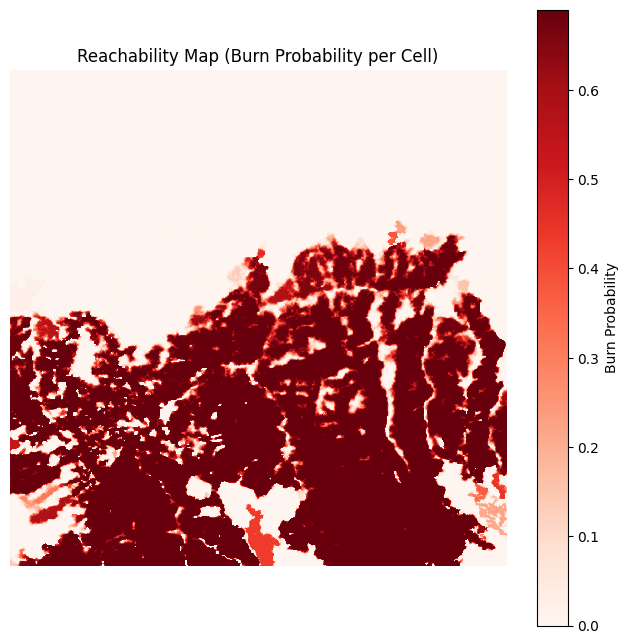

In [283]:
plot_reachability_map(reach_map, num_runs=100)

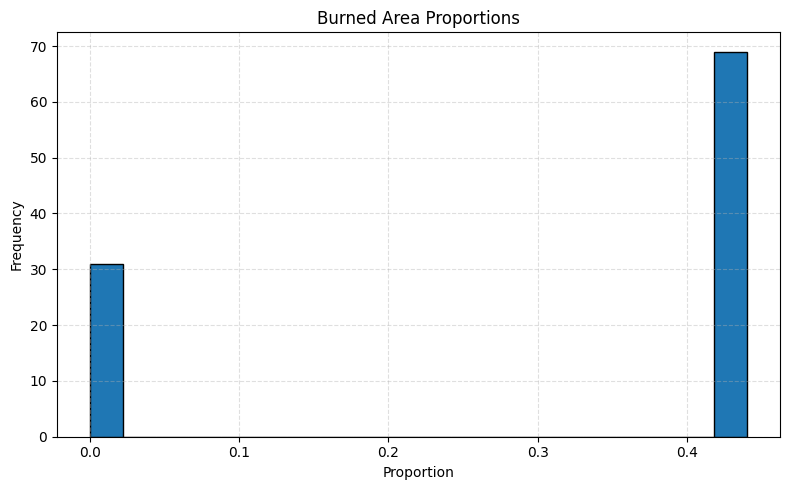

In [ ]:
plot_burn_proportion_histogram(
    burn_proportion,
    bins=20,
    title="Burned Area Proportions",
    xlabel="Proportion",
    ylabel="Frequency",
)

In [289]:
reach_map, burn_proportion = compute_reachability_and_burn_proportion(
    tree_cover,
    k=0.2,
    burn_rate=0.1,
    burn_threshold=0.05,
    num_runs=100,
)

Simulating fires: 100%|██████████| 100/100 [06:25<00:00,  3.86s/it]


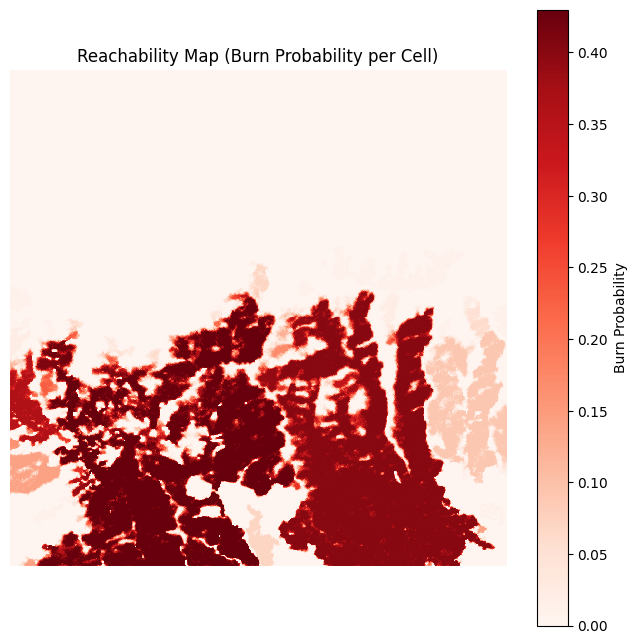

In [290]:
plot_reachability_map(reach_map, num_runs=100)

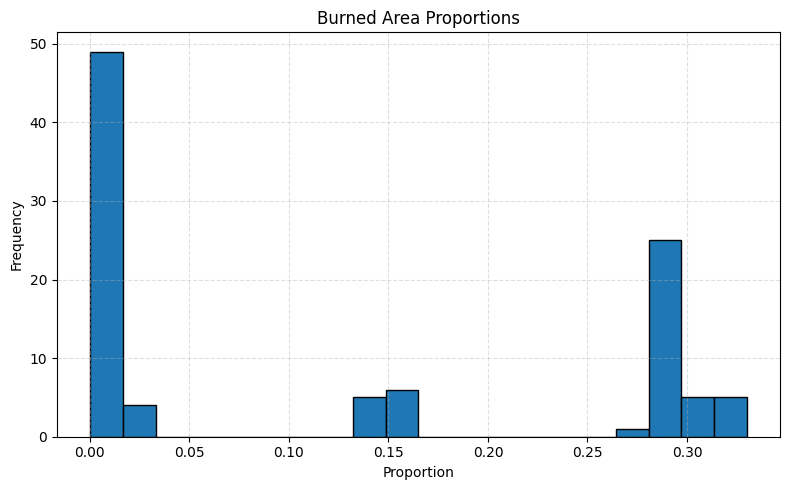

In [299]:
plot_burn_proportion_histogram(
    burn_proportion,
    bins=20,
    title="Burned Area Proportions",
    xlabel="Proportion",
    ylabel="Frequency",
)

#### Percolation


In [351]:
def check_percolation(tree_cover, k, burn_rate, burn_threshold, wind_strength=0):
    """
    Run one fire simulation and return True if fire percolates
    from the bottom 5 rows to the top of the grid (where settlement begins).

    Parameters:
        tree_cover: 2D array of tree densities [0, 1]
        k: spread coefficient
        burn_rate: fire consumption rate
        burn_threshold: density threshold to mark cell as burned
        wind_strength: magnitude of wind vector along y-axis

    Returns:
        True if fire reached the target zone, False otherwise
    """
    model = ForestFireModel(
        density_array=tree_cover.copy(),
        k=k,
        burn_rate=burn_rate,
        burn_threshold=burn_threshold,
        wind_vector=np.array([0, wind_strength]),
    )

    ignition_zone = model.density[495:500, :] > 0
    model.state[495:500, :][ignition_zone] = model.BURNING

    while np.any(model.state == model.BURNING):
        model.step()

    burned = model.state == model.BURNED
    return np.any(burned[0:200, :])

In [325]:
def estimate_percolation_probability(
    tree_cover, k, burn_rate, burn_threshold, wind_strength=0, num_runs=100
):
    """
    Estimate the probability that fire percolates for a given wind strength.

    Parameters:
        tree_cover: 2D array of tree densities [0, 1]
        k: spread coefficient
        burn_rate: fire consumption rate
        burn_threshold: density threshold to mark cell as burned
        wind_strength: magnitude of wind vector along x-axis
        num_runs: number of independent simulations

    Returns:
        percolation_probability: fraction of runs where fire reached the target zone
    """
    percolated = 0

    for _ in range(num_runs):
        if check_percolation(tree_cover, k, burn_rate, burn_threshold, wind_strength):
            percolated += 1

    return percolated / num_runs

In [354]:
def plot_percolation_vs_wind(
    tree_cover, k, burn_rate, burn_threshold, num_runs=10, num_points=10
):
    """
    Vary wind strength and plot percolation probability against it.

    Parameters:
        tree_cover: 2D array of tree densities [0, 1]
        k: spread coefficient
        burn_rate: fire consumption rate
        burn_threshold: density threshold to mark cell as burned
        num_runs: number of simulations per wind strength
        num_points: number of wind strength values sampled
    """
    wind_strengths = np.linspace(-1, 1, num_points)
    percolation_probs = []

    for ws in wind_strengths:
        p = estimate_percolation_probability(
            tree_cover=tree_cover,
            k=k,
            burn_rate=burn_rate,
            burn_threshold=burn_threshold,
            wind_strength=ws,
            num_runs=num_runs,
        )
        percolation_probs.append(p)

    plt.figure(figsize=(10, 5))
    plt.plot(wind_strengths, percolation_probs, "o-", color="tab:green")
    plt.xlabel("Wind Strength")
    plt.ylabel("Percolation Probability")
    plt.title("Percolation Probability vs. Wind Strength")
    plt.grid(alpha=0.5, linestyle="--")
    plt.show()

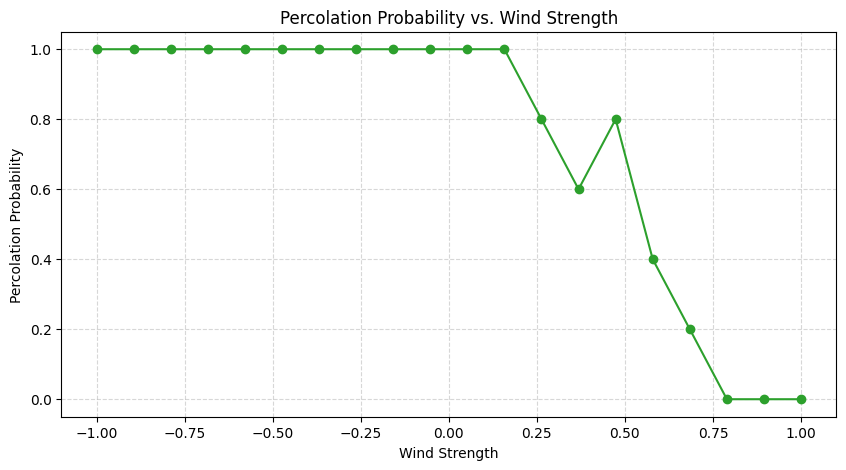

In [357]:
plot_percolation_vs_wind(
    tree_cover=tree_cover,
    k=0.4,
    burn_rate=0.1,
    burn_threshold=0.05,
    num_runs=5,
    num_points=20,
)



In [358]:
# fire starting at the bottom of the grid
def ignite_zone(state, density):
    mask = density[495:500, :] > 0
    state[495:500, :][mask] = ForestFireModel.BURNING

In [ ]:
# wind blowing up with 0.2 strength
model = ForestFireModel(
    density_array=tree_cover,
    k=0.5,
    burn_rate=0.1,
    burn_threshold=0.05,
    wind_vector=(0, 0.2),
)

animator.set_model(model)


animator.animate(
    total_frames=2000,
    fps=20,
    callback=ignite_zone,
)

Simulation: 100%|██████████| 2000/2000 [00:55<00:00, 36.25it/s]


In [360]:
# wind blowing up with 0.5 strength
model = ForestFireModel(
    density_array=tree_cover,
    k=0.5,
    burn_rate=0.1,
    burn_threshold=0.05,
    wind_vector=(0, 0.5),
)

animator.set_model(model)


animator.animate(
    total_frames=2000,
    fps=20,
    callback=ignite_zone,
)

Simulation: 100%|██████████| 2000/2000 [00:56<00:00, 35.17it/s]


In [361]:
# wind blowing up with 0.75 strength
model = ForestFireModel(
    density_array=tree_cover,
    k=0.5,
    burn_rate=0.1,
    burn_threshold=0.05,
    wind_vector=(0, 0.75),
)

animator.set_model(model)


animator.animate(
    total_frames=2000,
    fps=20,
    callback=ignite_zone,
)

Simulation: 100%|██████████| 2000/2000 [00:56<00:00, 35.23it/s]


In [367]:
# wind blowing up with 2 strength
model = ForestFireModel(
    density_array=tree_cover,
    k=0.5,
    burn_rate=0.1,
    burn_threshold=0.05,
    wind_vector=(0, 1.3),
)

animator.set_model(model)


animator.animate(
    total_frames=2000,
    fps=20,
    callback=ignite_zone,
)

Simulation: 100%|██████████| 2000/2000 [00:55<00:00, 36.32it/s]
